# RentSafeTO: Predicting Building Evaluation with Machine Learning
<br>
<div style="text-align: right"> 
Author: Hyunjung Kim<br>
Date: August 4, 2023
</div>

**Introduction:**

Welcome to our RentSafeTO project! In this capstone, we aim to predict the safety assessment of apartment buildings in Toronto using machine learning. Our goal is to provide valuable insights to property owners, empowering them to make informed decisions about housing maintain.

**The Big Idea:**

RentSafeTO revolves around analyzing factors that influence building safety. By considering variables such as building height, construction year, population density, laundry facilities, and waste disposal, our predictive model aims to forecast the safety evaluation outcomes.

**The Impact:**

The impact of RentSafeTO extends to multiple stakeholders. Prospective property buyers can benefit from a risk assessment before purchasing an apartment building. Tenants planning to move can access safety information to choose safer living environments. Landlords can proactively address safety concerns, leading to a more secure rental market.

**The Data:**

Our project utilizes data from the Toronto open data site, encompassing various apartment building evaluations. By analyzing this dataset, we aim to uncover patterns and correlations, enabling our predictive model to make accurate safety assessments.


**Columns**

1. Building Information:
   - _id: Unique row identifier for Open Data database
   - RSN: Building Identifier
   - YEAR REGISTERED: Year of Registration in RentSafeTO
   - YEAR BUILT: Year the Building was Constructed
   - YEAR EVALUATED: Year of Building Evaluation
   - PROPERTY TYPE: Type of Building Ownership (Private, Toronto Community Housing Corporation, Other Assisted or Social Housing Providers)
   - NUMBERING OF PROPERTY: Appropriate size and visibility of property numbering
   
2. Location Information:
   - WARD: Ward where the Building is Located
   - WARDNAME: Name of the Ward
   - SITE ADDRESS: Building Address
   - GRID: Administrative Area the Building Belongs to
   - LATITUDE
   - LONGITUDE
   - X
   - Y

3. Building Details:
   - CONFIRMED STOREYS: Number of Storeys in the Building
   - CONFIRMED UNITS: Number of Units (Dwellings) in the Building
   - EVALUATION COMPLETED ON: Date of Building Evaluation
   - NO OF AREAS EVALUATED: Number of items evaluated during a single evaluation
   - SCORE: Weighted Average Score of the Building
   - RESULTS_OF_SCORE : Result of the score

4. Exterior Maintenance:
   - EXTERIOR GROUNDS: Maintenance, cleanliness, landscaping, drainage, and lighting of exterior grounds
   - FENCING: Maintenance and materials of all fencing within the property
   - RETAINING WALLS: Maintenance and safety of all retaining walls
   - CATCH BASINS / STORM DRAINAGE: Maintenance and condition of catch basins and storm drainage systems
   - BUILDING EXTERIOR: Maintenance and safety of exterior walls, flashing, pipes, attachments, and balcony slabs
   - BALCONY GUARDS: Maintenance and safety of balcony guards
   - WINDOWS: Maintenance of all windows, safety devices, and window screens
   - EXT. RECEPTACLE STORAGE AREA: Maintenance and cleanliness of exterior waste storage areas
   - EXTERIOR WALKWAYS: Maintenance, cleanliness, drainage, and safety of exterior walkways
   - CLOTHING DROP BOXES: Maintenance and safety of clothing drop boxes
   - ACCESSORY BUILDINGS: Maintenance and safety of additional buildings or structures
   - WATER_PEN_EXT_BLDG_ELEMENTS: measures water infiltration in building components.

5. Interior Maintenance:
   - INTERCOM: Maintenance and operability of intercoms
   - EMERGENCY CONTACT SIGN: Maintenance of emergency contact signs
   - LOBBY - WALLS AND CEILING: Maintenance and safety of lobby walls and ceilings
   - LOBBY FLOORS: Maintenance and safety of lobby floors
   - LAUNDRY ROOM: Maintenance, operability, and lighting of laundry rooms
   - INT. RECEPTACLE STORAGE AREA: Maintenance and cleanliness of interior waste storage areas
   - MAIL RECEPTACLES: Maintenance and safety of mailboxes
   - EXTERIOR DOORS: Maintenance and operability of exterior doors
   - STORAGE AREAS/LOCKERS MAINT.: Maintenance of storage areas/lockers
   - ELEVATOR MAINTENANCE: Maintenance of elevators to keep them in good repair
   - ELEVATOR COSMETICS: Maintenance and condition of elevator parts and attachments

6. Common Area Maintenance:
   - COMMON AREA VENTILATION: Maintenance of ventilation systems in common areas
   - ELECTRICAL SERVICES / OUTLETS: Maintenance of electrical fixtures, switches, receptacles, and connections
   - CHUTE ROOMS - MAINTENANCE: Maintenance and operability of chute rooms
   - STAIRWELL - WALLS AND CEILING: Maintenance and safety of stairwell walls and ceilings
   - STAIRWELL - LANDING AND STEPS: Maintenance and safety of stairwell landings and steps
   - STAIRWELL LIGHTING: Maintenance and safety of stairwell lighting
   - INT. HANDRAIL / GUARD - SAFETY: Safety of interior handrails and guards
   - INT. HANDRAIL / GUARD - MAINT.: Maintenance and cleanliness of interior handrails and guards

7. Building Hygiene:
   - BUILDING CLEANLINESS: Keeping common areas clean according to standards
   - COMMON AREA PESTS: Handling pests in common areas
   - GRAFFITI: Handling of graffiti in common areas or exterior grounds

8. Building Services:
   - TENANT NOTIFICATION BOARD: Displaying important notices for tenants
   - PEST CONTROL LOG: Keeping a log of pest inspections and treatments
   - MAINTENANCE LOG: Keeping a log of service and maintenance on various systems
   - CLEANING LOG: Keeping a log of scheduled or unscheduled cleaning activities
   - VITAL SERVICE PLAN: Maintaining a plan for essential services to tenants
   - ELECTRICAL SAFETY PLAN: Maintaining an electrical maintenance plan
   - STATE OF GOOD REPAIR PLAN: Maintaining a plan for repairs and improvements
   - TENANT SERVICE REQUEST LOG: Keeping a log of tenant service requests

9. Others:
   - PARKING AREAS: Maintenance and cleanliness of parking areas
   - POOLS: Maintenance and access to pools, if applicable
   - OTHER AMENITIES: Maintenance and access to community rooms, play areas, gyms, or tennis courts
   - ABANDONED EQUIP./DERELICT VEH.: Handling abandoned equipment and derelict vehicles


In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from warnings import filterwarnings

filterwarnings('ignore')

In [3]:
# Read Data
df = pd.read_csv('../data/Apartment Building Evaluation.csv')

In [4]:
# Sanity Check
df.head()

,_id,RSN,YEAR_REGISTERED,YEAR_EVALUATED,YEAR_BUILT,PROPERTY_TYPE,WARD,WARDNAME,SITE_ADDRESS,CONFIRMED_STOREYS,...,EXTERIOR_WALKWAYS,BALCONY_GUARDS,WATER_PEN_EXT_BLDG_ELEMENTS,PARKING_AREA,OTHER_FACILITIES,GRID,LATITUDE,LONGITUDE,X,Y
0,4167486,4304347,NaN,NaN,1999.0,PRIVATE,2,Etobicoke Centre,** CREATED IN ERROR ** 399 THE WEST MALL,22,...,5.0,5.0,5.0,5.0,5.0,W0233,43.643781,-79.565456,299503.625,4833538.964
1,4167487,5157421,2023.0,NaN,1973.0,TCHC,17,Don Valley North,6 TREE SPARROWAY,4,...,3.0,5.0,4.0,3.0,4.0,N1721,43.791384,-79.369630,315272.148,4849932.515
2,4167488,5156814,2023.0,NaN,1973.0,TCHC,17,Don Valley North,13 FIELD SPARROWAY,4,...,4.0,5.0,4.0,3.0,4.0,N1721,43.790920,-79.368771,315334.815,4849906.373
3,4167489,5157387,2023.0,NaN,1973.0,TCHC,17,Don Valley North,4 TREE SPARROWAY,4,...,3.0,5.0,4.0,3.0,4.0,N1721,43.791448,-79.369332,315291.755,4849938.162
4,4167490,5156871,2023.0,NaN,1973.0,TCHC,17,Don Valley North,2 TREE SPARROWAY,4,...,5.0,5.0,4.0,3.0,4.0,N1721,43.791511,-79.369045,315330.308,4849947.465



**Data Cleaning (Summary):**

1. The dataset consists of 11,760 rows and 40 columns.
2. There are no duplicate rows, but some columns contain duplicated information.
3. Duplicate columns were removed during the data cleaning process.
4. Columns with a missing value of 50% or more were deleted.
5. some columns have similar information so those were deleted.

In [5]:
df.shape

(11760, 40)

In this dataset, we have 11760 rows and 40 coulumns. 

In [6]:
for i in df.columns:
    print
    print(i)

_id
RSN
YEAR_REGISTERED
YEAR_EVALUATED
YEAR_BUILT
PROPERTY_TYPE
WARD
WARDNAME
SITE_ADDRESS
CONFIRMED_STOREYS
CONFIRMED_UNITS
EVALUATION_COMPLETED_ON
SCORE
RESULTS_OF_SCORE
NO_OF_AREAS_EVALUATED
ENTRANCE_LOBBY
ENTRANCE_DOORS_WINDOWS
SECURITY
STAIRWELLS
LAUNDRY_ROOMS
INTERNAL_GUARDS_HANDRAILS
GARBAGE_CHUTE_ROOMS
GARBAGE_BIN_STORAGE_AREA
ELEVATORS
STORAGE_AREAS_LOCKERS
INTERIOR_WALL_CEILING_FLOOR
INTERIOR_LIGHTING_LEVELS
GRAFFITI
EXTERIOR_CLADDING
EXTERIOR_GROUNDS
EXTERIOR_WALKWAYS
BALCONY_GUARDS
WATER_PEN_EXT_BLDG_ELEMENTS
PARKING_AREA
OTHER_FACILITIES
GRID
LATITUDE
LONGITUDE
X
Y


In [7]:
df.duplicated().sum()

0

**And there is not duplicated row each one as unique.**

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11760 entries, 0 to 11759
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   _id                          11760 non-null  int64  
 1   RSN                          11760 non-null  int64  
 2   YEAR_REGISTERED              11455 non-null  float64
 3   YEAR_EVALUATED               9751 non-null   float64
 4   YEAR_BUILT                   11714 non-null  float64
 5   PROPERTY_TYPE                11760 non-null  object 
 6   WARD                         11760 non-null  int64  
 7   WARDNAME                     11760 non-null  object 
 8   SITE_ADDRESS                 11760 non-null  object 
 9   CONFIRMED_STOREYS            11760 non-null  int64  
 10  CONFIRMED_UNITS              11760 non-null  int64  
 11  EVALUATION_COMPLETED_ON      11760 non-null  object 
 12  SCORE                        11760 non-null  int64  
 13  RESULTS_OF_SCORE

In [9]:
df['EVALUATION_COMPLETED_ON'] = pd.to_datetime(df['EVALUATION_COMPLETED_ON']).dt.year

**Change to year because it is more efficient to represent only the year rather than the exact date evaluated.**

**Most of the columns are scored from 1 to 5. This means that the columns with scores are the main sources used for judgment.**

In [10]:
for i in df.columns:
    print('number of distinct in', i)
    print(':', df[i].nunique())
        

number of distinct in _id
: 11760
number of distinct in RSN
: 3513
number of distinct in YEAR_REGISTERED
: 7
number of distinct in YEAR_EVALUATED
: 5
number of distinct in YEAR_BUILT
: 130
number of distinct in PROPERTY_TYPE
: 3
number of distinct in WARD
: 25
number of distinct in WARDNAME
: 25
number of distinct in SITE_ADDRESS
: 3513
number of distinct in CONFIRMED_STOREYS
: 40
number of distinct in CONFIRMED_UNITS
: 383
number of distinct in EVALUATION_COMPLETED_ON
: 7
number of distinct in SCORE
: 66
number of distinct in RESULTS_OF_SCORE
: 4
number of distinct in NO_OF_AREAS_EVALUATED
: 11
number of distinct in ENTRANCE_LOBBY
: 5
number of distinct in ENTRANCE_DOORS_WINDOWS
: 5
number of distinct in SECURITY
: 5
number of distinct in STAIRWELLS
: 5
number of distinct in LAUNDRY_ROOMS
: 5
number of distinct in INTERNAL_GUARDS_HANDRAILS
: 5
number of distinct in GARBAGE_CHUTE_ROOMS
: 5
number of distinct in GARBAGE_BIN_STORAGE_AREA
: 5
number of distinct in ELEVATORS
: 5
number of 

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11760 entries, 0 to 11759
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   _id                          11760 non-null  int64  
 1   RSN                          11760 non-null  int64  
 2   YEAR_REGISTERED              11455 non-null  float64
 3   YEAR_EVALUATED               9751 non-null   float64
 4   YEAR_BUILT                   11714 non-null  float64
 5   PROPERTY_TYPE                11760 non-null  object 
 6   WARD                         11760 non-null  int64  
 7   WARDNAME                     11760 non-null  object 
 8   SITE_ADDRESS                 11760 non-null  object 
 9   CONFIRMED_STOREYS            11760 non-null  int64  
 10  CONFIRMED_UNITS              11760 non-null  int64  
 11  EVALUATION_COMPLETED_ON      11760 non-null  int32  
 12  SCORE                        11760 non-null  int64  
 13  RESULTS_OF_SCORE

**In the information, we can see that things that should be defined as int are float. We can see NA in the information. That's why I'm going to clean up the NA and convert the type.**

**As a target 'SCORE' shows the results in score, and 'RESULTS_OF_SCORE' tells the results of the revaluation period that it receives.**

In [12]:
# There are four following results as a result of the evaluation score.

df['RESULTS_OF_SCORE'].value_counts()

RESULTS_OF_SCORE
Evaluation needs to be conducted in 2 years    7396
Evaluation needs to be conducted in 1 year     2619
Evaluation needs to be conducted in 3 years    1628
Building Audit                                  117
Name: count, dtype: int64

**_id, RSN, LATITUDE, LATITUDE, X, and Y are not the columns for analysis, but for identification. So, we don't need to see as plots.**

In [13]:
plot_list = df.columns[2:-4]
plot_list

no_target_list = df[plot_list].drop(columns=['SCORE',
       'RESULTS_OF_SCORE'])

**The plots made this jupyter notebook so we annotated the code temporarily**

In [14]:
# plots of the scored columns

#  for i in plot_list:
#     if df[i].nunique() <= 66 :
#         plt.figure()
#         plt.title(i)
#         df[i].value_counts().plot.bar()
#         plt.show()

There are several type of columns. Most of the columns are expressed as scores from 1 to 5.

<5 scores columns - 20ea><br>
ENTRANCE_LOBBY<br>
ENTRANCE_DOORS_WINDOWS<br>
SECURITY<br>
STAIRWELLS<br>
LAUNDRY_ROOMS<br>
INTERNAL_GUARDS_HANDRAILS<br>
GARBAGE_CHUTE_ROOMS<br>
GARBAGE_BIN_STORAGE_AREA<br>
ELEVATORS<br>
STORAGE_AREAS_LOCKERS<br>
INTERIOR_WALL_CEILING_FLOOR<br>
INTERIOR_LIGHTING_LEVELS<br>
GRAFFITI<br>
EXTERIOR_CLADDING<br>
EXTERIOR_GROUNDS<br>
EXTERIOR_WALKWAYS<br>
BALCONY_GUARDS<br>
WATER_PEN_EXT_BLDG_ELEMENTS<br>
PARKING_AREA<br>
OTHER_FACILITIES<br>


**As we can see,**

1. we can see that we have 17% of null in 'YEAR_EVALUATED' however the year of this columns is presented in 'EVALUATION_COMPLETED_ON'.
2. 'GARBAGE_CHUTE_ROOMS'(56.62%), 'ELEVATORS'(41.35%) 'STORAGE_AREAS_LOCKERS'(59.41%), and 'OTHER_FACILITIES'(80.83%) contains missing values over 40%.
3. 'X' and 'Y' columns represent same informations as the 'LATITUDE' and 'LONGTITUDE'
4. 'WARDNAME' present same information with 'WARD'.
5. 'GRID', 'SITE_ADDRESS' are location data however we already have lon and lat.
6. '_id' and 'RSA' are columns for identification.

**It mean we can drop those columns because cleaned dataset make more accurate analysis.**

In [15]:
df.isna().sum()/df.shape[0]*100

_id                             0.000000
RSN                             0.000000
YEAR_REGISTERED                 2.593537
YEAR_EVALUATED                 17.083333
YEAR_BUILT                      0.391156
PROPERTY_TYPE                   0.000000
WARD                            0.000000
WARDNAME                        0.000000
SITE_ADDRESS                    0.000000
CONFIRMED_STOREYS               0.000000
CONFIRMED_UNITS                 0.000000
EVALUATION_COMPLETED_ON         0.000000
SCORE                           0.000000
RESULTS_OF_SCORE                0.000000
NO_OF_AREAS_EVALUATED           0.000000
ENTRANCE_LOBBY                  0.017007
ENTRANCE_DOORS_WINDOWS          0.008503
SECURITY                        0.051020
STAIRWELLS                      0.025510
LAUNDRY_ROOMS                   5.578231
INTERNAL_GUARDS_HANDRAILS       0.025510
GARBAGE_CHUTE_ROOMS            56.615646
GARBAGE_BIN_STORAGE_AREA        0.093537
ELEVATORS                      41.352041
STORAGE_AREAS_LO

In [16]:
df_clean = df.drop(['RSN','WARD','SITE_ADDRESS','YEAR_EVALUATED','X','Y','GARBAGE_CHUTE_ROOMS', 'ELEVATORS', 'STORAGE_AREAS_LOCKERS', 'OTHER_FACILITIES'], axis=1)

In [17]:
df_clean.isna().sum()/df_clean.shape[0]*100

_id                             0.000000
YEAR_REGISTERED                 2.593537
YEAR_BUILT                      0.391156
PROPERTY_TYPE                   0.000000
WARDNAME                        0.000000
CONFIRMED_STOREYS               0.000000
CONFIRMED_UNITS                 0.000000
EVALUATION_COMPLETED_ON         0.000000
SCORE                           0.000000
RESULTS_OF_SCORE                0.000000
NO_OF_AREAS_EVALUATED           0.000000
ENTRANCE_LOBBY                  0.017007
ENTRANCE_DOORS_WINDOWS          0.008503
SECURITY                        0.051020
STAIRWELLS                      0.025510
LAUNDRY_ROOMS                   5.578231
INTERNAL_GUARDS_HANDRAILS       0.025510
GARBAGE_BIN_STORAGE_AREA        0.093537
INTERIOR_WALL_CEILING_FLOOR     0.017007
INTERIOR_LIGHTING_LEVELS        0.017007
GRAFFITI                        0.331633
EXTERIOR_CLADDING               0.076531
EXTERIOR_GROUNDS                0.127551
EXTERIOR_WALKWAYS               0.051020
BALCONY_GUARDS  

In [18]:
# Columns evaluated in five digits.

df_scored = df_clean[['ENTRANCE_LOBBY',               
'ENTRANCE_DOORS_WINDOWS',       
'SECURITY',                     
'STAIRWELLS',                   
'LAUNDRY_ROOMS',                
'INTERNAL_GUARDS_HANDRAILS',    
'GARBAGE_BIN_STORAGE_AREA',                        
'INTERIOR_WALL_CEILING_FLOOR',  
'INTERIOR_LIGHTING_LEVELS',     
'GRAFFITI',                     
'EXTERIOR_CLADDING',            
'EXTERIOR_GROUNDS',             
'EXTERIOR_WALKWAYS',            
'BALCONY_GUARDS',               
'WATER_PEN_EXT_BLDG_ELEMENTS',  
'PARKING_AREA',                 
'GRID']]

**Let's look at the items evaluated from 1 to 5.**

In [19]:
df_scored.describe()

,ENTRANCE_LOBBY,ENTRANCE_DOORS_WINDOWS,SECURITY,STAIRWELLS,LAUNDRY_ROOMS,INTERNAL_GUARDS_HANDRAILS,GARBAGE_BIN_STORAGE_AREA,INTERIOR_WALL_CEILING_FLOOR,INTERIOR_LIGHTING_LEVELS,GRAFFITI,EXTERIOR_CLADDING,EXTERIOR_GROUNDS,EXTERIOR_WALKWAYS,BALCONY_GUARDS,WATER_PEN_EXT_BLDG_ELEMENTS,PARKING_AREA
count,11758.000000,11759.000000,11754.000000,11757.000000,11104.000000,11757.000000,11749.000000,11758.000000,11758.000000,11721.000000,11751.000000,11745.000000,11754.000000,7973.000000,11754.000000,10704.000000
mean,3.713642,3.675313,4.126425,3.453857,3.575919,3.603640,3.607201,3.492686,3.672393,4.610869,3.549060,3.650575,3.643866,3.752665,3.668453,3.392096
std,0.775948,0.770057,0.877997,0.787374,0.794015,0.830116,0.782764,0.767906,0.878231,0.755874,0.718478,0.754074,0.744887,0.833194,0.739714,0.757125
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
50%,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,4.000000,3.000000,4.000000,5.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000
75%,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


**Most of scores are over 3, but we should care the scores under 3 because we should find an environment where we get low scores, result is the audit.**

**32.20% of the value of 'BALCONY_GUARDS', 5.58% of the value of 'LAUNDRY_ROOMS', and 8.98% of the value of 'PARKING_AREA' are missing. We will replace those with the mode**

**Finally, All other rows with missing values will be dropped.**

In [20]:
most_freq1 = df_clean['BALCONY_GUARDS'].value_counts().idxmax()
most_freq2 = df_clean['LAUNDRY_ROOMS'].value_counts().idxmax()
most_freq3 = df_clean['PARKING_AREA'].value_counts().idxmax()

df_clean['BALCONY_GUARDS'].fillna(most_freq1, inplace = True)
df_clean['LAUNDRY_ROOMS'].fillna(most_freq2, inplace = True)
df_clean['PARKING_AREA'].fillna(most_freq3, inplace = True)

In [21]:
df_clean.dropna(inplace=True)

In [22]:
# Clean data sanity check
df_clean.isna().sum()/df_clean.shape[0]*100

_id                            0.0
YEAR_REGISTERED                0.0
YEAR_BUILT                     0.0
PROPERTY_TYPE                  0.0
WARDNAME                       0.0
CONFIRMED_STOREYS              0.0
CONFIRMED_UNITS                0.0
EVALUATION_COMPLETED_ON        0.0
SCORE                          0.0
RESULTS_OF_SCORE               0.0
NO_OF_AREAS_EVALUATED          0.0
ENTRANCE_LOBBY                 0.0
ENTRANCE_DOORS_WINDOWS         0.0
SECURITY                       0.0
STAIRWELLS                     0.0
LAUNDRY_ROOMS                  0.0
INTERNAL_GUARDS_HANDRAILS      0.0
GARBAGE_BIN_STORAGE_AREA       0.0
INTERIOR_WALL_CEILING_FLOOR    0.0
INTERIOR_LIGHTING_LEVELS       0.0
GRAFFITI                       0.0
EXTERIOR_CLADDING              0.0
EXTERIOR_GROUNDS               0.0
EXTERIOR_WALKWAYS              0.0
BALCONY_GUARDS                 0.0
WATER_PEN_EXT_BLDG_ELEMENTS    0.0
PARKING_AREA                   0.0
GRID                           0.0
LATITUDE            

In [23]:
float_columns = [
    'YEAR_REGISTERED', 
    'YEAR_BUILT',
    'ENTRANCE_LOBBY',
    'ENTRANCE_DOORS_WINDOWS',
    'SECURITY',
    'STAIRWELLS',
    'LAUNDRY_ROOMS',
    'INTERNAL_GUARDS_HANDRAILS',
    'GARBAGE_BIN_STORAGE_AREA',
    'INTERIOR_WALL_CEILING_FLOOR',
    'INTERIOR_LIGHTING_LEVELS',
    'GRAFFITI',
    'EXTERIOR_CLADDING',
    'EXTERIOR_GROUNDS',
    'EXTERIOR_WALKWAYS',
    'BALCONY_GUARDS',
    'WATER_PEN_EXT_BLDG_ELEMENTS',
    'PARKING_AREA']
df_clean[float_columns] = df_clean[float_columns].astype(int)

**Now that there is no NA, we will fix the data type.**

In [24]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11152 entries, 1 to 11759
Data columns (total 30 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   _id                          11152 non-null  int64  
 1   YEAR_REGISTERED              11152 non-null  int64  
 2   YEAR_BUILT                   11152 non-null  int64  
 3   PROPERTY_TYPE                11152 non-null  object 
 4   WARDNAME                     11152 non-null  object 
 5   CONFIRMED_STOREYS            11152 non-null  int64  
 6   CONFIRMED_UNITS              11152 non-null  int64  
 7   EVALUATION_COMPLETED_ON      11152 non-null  int32  
 8   SCORE                        11152 non-null  int64  
 9   RESULTS_OF_SCORE             11152 non-null  object 
 10  NO_OF_AREAS_EVALUATED        11152 non-null  int64  
 11  ENTRANCE_LOBBY               11152 non-null  int64  
 12  ENTRANCE_DOORS_WINDOWS       11152 non-null  int64  
 13  SECURITY             

**Columns were classified before running EDA. This is because using 40 rows for analysis at once is inefficient and cannot guarantee accurate results.**

1. About building Information
2. About Maintenance (Exterior, Interior, and Common Area)

Of course, hygiene or additional facilities can also be indirectly important. But we want to look at more direct factors for safety.

**Relationship between basic apartment information and score, not evaluation score**

- Numerical data - continuous
    - 'YEAR_REGISTERED',              
    - 'YEAR_BUILT'    

- Numerical data - discrete
    - 'CONFIRMED_STOREYS',            
    - 'CONFIRMED_UNITS',
    - 'NO_OF_AREAS_EVALUATED' 

- Categorical - nominal
    - 'PROPERTY_TYPE',                
    - 'WARDNAME'                     

- target Variable
    - 'SCORE'(Numerical target),
    - 'RESULTS_OF_SCORE'(Categorical target)

In [25]:
from scipy import stats
import statsmodels.api as sm

Y = df_clean['SCORE'].values

for i in ['YEAR_REGISTERED', 'YEAR_BUILT', 'CONFIRMED_STOREYS', 'CONFIRMED_UNITS', 'NO_OF_AREAS_EVALUATED']:
    print('*', i)
    X=df_clean[i].values
    print('Correlation:', stats.pearsonr(X,Y)[0])
    print('P-value:', stats.pearsonr(X,Y)[1])
    print('\n')

* YEAR_REGISTERED
Correlation: -0.04694172099864394
P-value: 7.072356943071497e-07


* YEAR_BUILT
Correlation: 0.16873709868865364
P-value: 5.160153615173216e-72


* CONFIRMED_STOREYS
Correlation: 0.12568179491929196
P-value: 1.6842857551320354e-40


* CONFIRMED_UNITS
Correlation: 0.09936299669697163
P-value: 7.145319371979502e-26


* NO_OF_AREAS_EVALUATED
Correlation: 0.23153736362899446
P-value: 1.274036340575308e-135




**Each of the P-value of the columns related to apartment information is significantly small. It means it is worth**

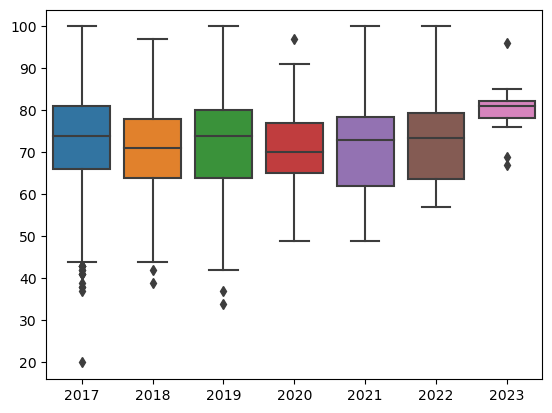

In [26]:
plt.figure()

Y = df_clean['SCORE'].values
X = df_clean['YEAR_REGISTERED'].values

sns.boxplot(x=X, y=Y)
plt.show()


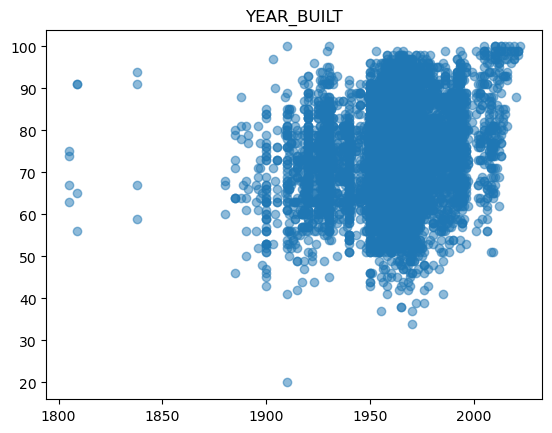

In [27]:

Y = df_clean['SCORE'].values
X = df_clean['YEAR_BUILT'].values
plt.scatter(X, Y, alpha=0.5)
plt.title('YEAR_BUILT')
plt.show()

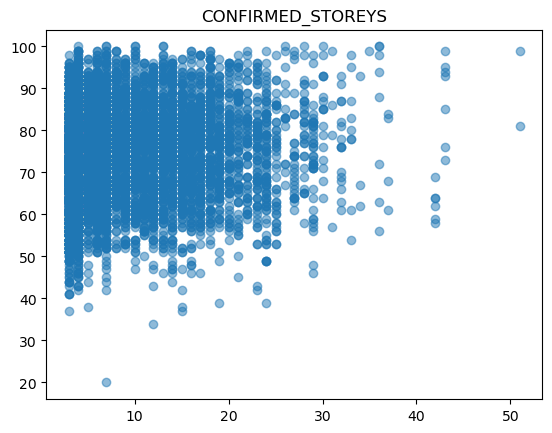

In [28]:
Y = df_clean['SCORE'].values
X = df_clean['CONFIRMED_STOREYS'].values
plt.scatter(X, Y, alpha=0.5)
plt.title('CONFIRMED_STOREYS')
plt.show()

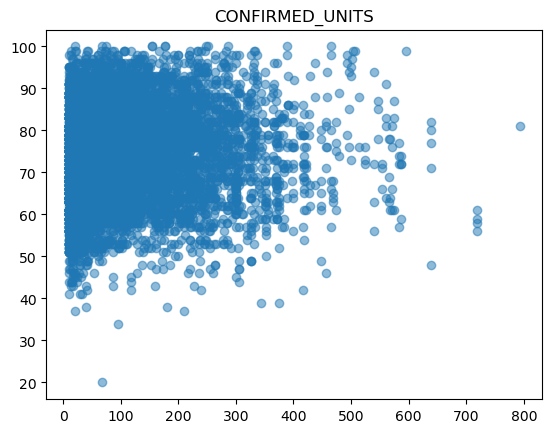

In [29]:
Y = df_clean['SCORE'].values
X = df_clean['CONFIRMED_UNITS'].values
plt.scatter(X, Y, alpha=0.5)
plt.title('CONFIRMED_UNITS')
plt.show()

<Axes: title={'center': 'SCORE'}, xlabel='[NO_OF_AREAS_EVALUATED]'>

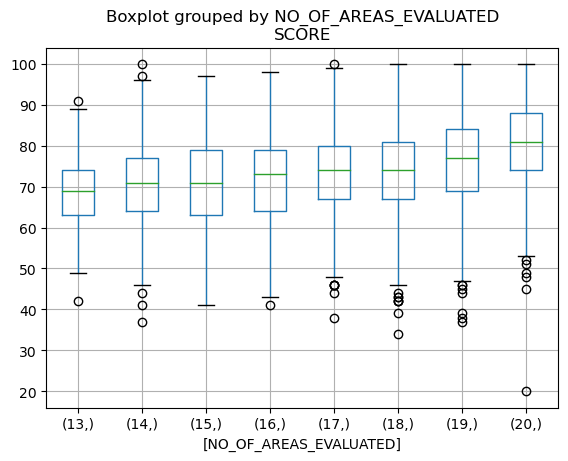

In [30]:
Y = df_clean['SCORE'].values
X = df_clean['NO_OF_AREAS_EVALUATED'].values
#sns.boxplot(x=X, y=Y)
df_clean.boxplot(column=['SCORE'], by=['NO_OF_AREAS_EVALUATED'])

**Let's look at the category data.**
- 'PROPERTY_TYPE'
- 'WARDNAME'

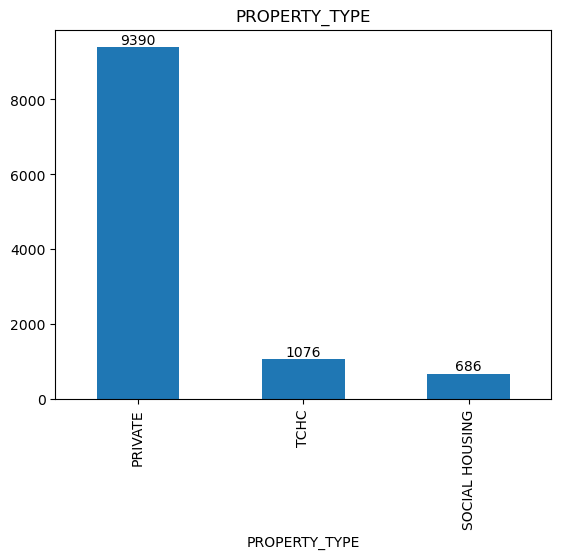

In [31]:
plt.figure()
plt.title('PROPERTY_TYPE')

property_counts = df_clean['PROPERTY_TYPE'].value_counts()

ax = df_clean['PROPERTY_TYPE'].value_counts().plot.bar()

for i, count in enumerate(property_counts):
    ax.annotate(str(count), xy=(i, count), ha='center', va='bottom')
    
plt.show()

**Most buildings are privately owned.**

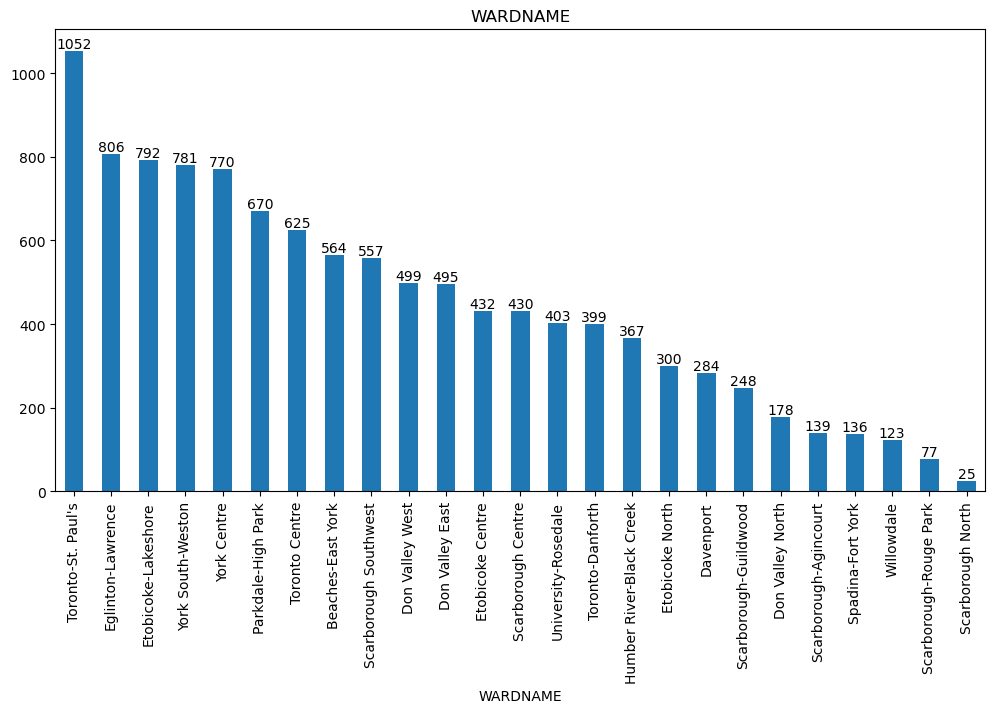

In [32]:
plt.figure(figsize = (12,6))
plt.title('WARDNAME')

wardname_counts = df_clean['WARDNAME'].value_counts()

ax = df_clean['WARDNAME'].value_counts().plot.bar()

for i, count in enumerate(wardname_counts):
    ax.annotate(str(count), xy=(i, count), ha='center', va='bottom')
plt.show()

**"Toronto-St. Paul's" has the most buildings, followed by "Eglinton-Lawrence" and "Etobicoke-Lakeshore".**

In [33]:
!pip install folium

In [34]:
import folium

In [35]:
# Latitude of Toronto
latitude = 43.651070
# Longtitude
longitude = -79.347015

In [36]:
# the points of apartments
location_score = df_clean[['LATITUDE', 'LONGITUDE','SCORE']]

In [37]:
from folium.plugins import MarkerCluster

m = folium.Map(location=[latitude, longitude],
              zoom_start=13,
              width=750,
              height=500
              )

# CN Tower location
folium.Marker([43.642567, -79.387054],
             popup='CN Tower',
             tooltip='Landmark of Toronto').add_to(m)

location = df_clean[['LATITUDE', 'LONGITUDE']]

marker_cluster = MarkerCluster().add_to(m)

for lat, long in zip(location['LATITUDE'], location['LONGITUDE']):
    folium.Marker([lat, long], icon = folium.Icon(color="green")).add_to(marker_cluster)

# m.save('zoom.html')
    
m

In [38]:
from folium.plugins import HeatMap

m = folium.Map(location=[latitude, longitude],
              zoom_start=13,
              width=750,
              height=500
              )

# CN Tower location
folium.Marker([43.642567, -79.387054],
             popup='CN Tower',
             tooltip='Landmark of Toronto').add_to(m)

location = df_clean[['LATITUDE', 'LONGITUDE']]

data = location.values.tolist()

heatmap = HeatMap(data,
                 min_opacity=0.05, 
                max_opacity=0.9, 
                radius=25)

heatmap.add_to(m)

# m.save('heatmap.html')

m

**This time we will look at the EDA for the items evaluated.**

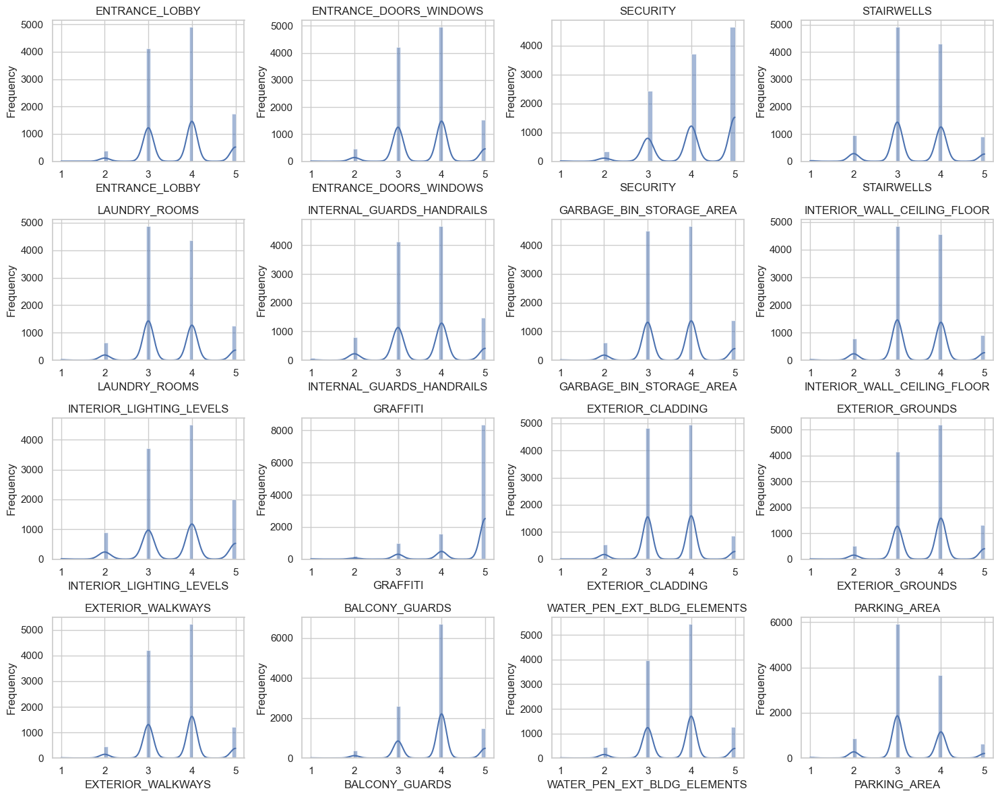

In [45]:
subset_columns = ['ENTRANCE_LOBBY', 'ENTRANCE_DOORS_WINDOWS', 'SECURITY', 'STAIRWELLS', 'LAUNDRY_ROOMS', 
                  'INTERNAL_GUARDS_HANDRAILS', 'GARBAGE_BIN_STORAGE_AREA', 'INTERIOR_WALL_CEILING_FLOOR', 
                  'INTERIOR_LIGHTING_LEVELS', 'GRAFFITI', 'EXTERIOR_CLADDING', 'EXTERIOR_GROUNDS', 
                  'EXTERIOR_WALKWAYS', 'BALCONY_GUARDS', 'WATER_PEN_EXT_BLDG_ELEMENTS', 'PARKING_AREA']

subset_df = df_clean[subset_columns]

sns.set(style="whitegrid")

f, axes = plt.subplots(4, 4, figsize=(15, 12))
axes = axes.ravel()

# Plot histograms for each column
for i, col in enumerate(subset_columns):
    sns.histplot(data=subset_df, x=col, ax=axes[i], kde=True)
    axes[i].set_title(col)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()

plt.show()

## Modeling

**We will do a linear regression analysis with Numerical columns.**

## LinearRegression in linear_model 

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [47]:
X = df_clean[['YEAR_REGISTERED', 'YEAR_BUILT', 'CONFIRMED_STOREYS', 'CONFIRMED_UNITS', 'NO_OF_AREAS_EVALUATED']]
y = df_clean['SCORE']

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [49]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [50]:
y_pred = model.predict(X_test)
y_pred 

array([71.09875189, 76.2080582 , 75.62945901, ..., 69.52470475,
       73.78822268, 74.07809092])

In [51]:
from sklearn.metrics import mean_absolute_error

In [52]:
mae_pred = mean_absolute_error(y_pred, y_test) 
mae_pred

8.158775554020059

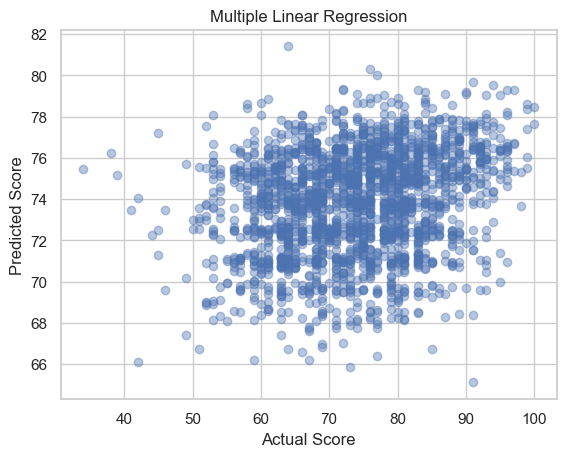

In [53]:
plt.figure()

plt.scatter(y_test, y_pred, alpha=0.4)
plt.xlabel('Actual Score')
plt.ylabel('Predicted Score')
plt.title('Multiple Linear Regression')

plt.show()

In [54]:
model.coef_

array([-0.19581599,  0.04213866,  0.13682133, -0.01331547,  1.33158188])

**The above chart shows the prediction and actual data of linear regression analysis with numerical data. Unfortunately, the prediction is not successful because it does not have a linear shape.**

In [55]:
X2 = df_clean[['YEAR_BUILT','CONFIRMED_STOREYS']]
#X = df_clean[['YEAR_BUILT', 'CONFIRMED_STOREYS', 'CONFIRMED_UNITS']]
y2 = df_clean['SCORE']

In [56]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

In [57]:
model = LinearRegression()
model.fit(X2_train, y2_train)

LinearRegression()

In [58]:
y2_pred = model.predict(X2_test)

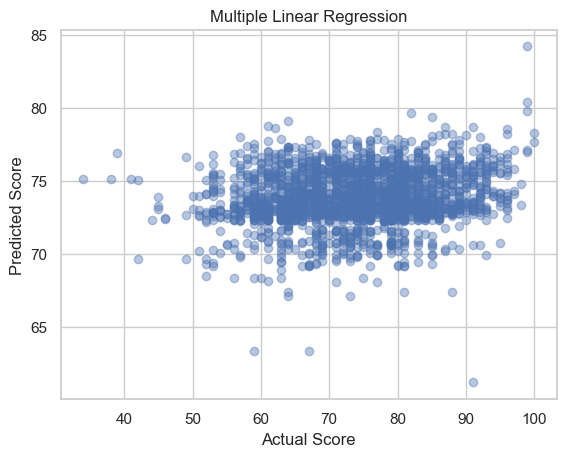

In [59]:
plt.figure()

plt.scatter(y2_test, y2_pred, alpha=0.4)
plt.xlabel('Actual Score')
plt.ylabel('Predicted Score')
plt.title('Multiple Linear Regression')

plt.show()

**This doesn't seem accurate either, using only two columns.We're going to try using other columns.**

## Linear Regression in statsmodels

In [60]:
import statsmodels.api as sm

**In the df_clean, we have columns of identification, location information. However, they are not required for linear regression models, so we will only use what we need in the model.**

In [61]:
# They are columns that have no redundancy and have unique values used for evaluation.
eva_columns = df_clean[['YEAR_REGISTERED',               
'YEAR_BUILT',                    
'CONFIRMED_STOREYS',             
'CONFIRMED_UNITS',               
'NO_OF_AREAS_EVALUATED',         
'ENTRANCE_LOBBY',                
'ENTRANCE_DOORS_WINDOWS',        
'SECURITY',                      
'STAIRWELLS',                    
'LAUNDRY_ROOMS',                 
'INTERNAL_GUARDS_HANDRAILS',     
'GARBAGE_BIN_STORAGE_AREA',      
'INTERIOR_WALL_CEILING_FLOOR',   
'INTERIOR_LIGHTING_LEVELS',      
'GRAFFITI',                      
'EXTERIOR_CLADDING',             
'EXTERIOR_GROUNDS',              
'EXTERIOR_WALKWAYS',             
'BALCONY_GUARDS',               
'WATER_PEN_EXT_BLDG_ELEMENTS',   
'PARKING_AREA']]

In [62]:
df_encoded = pd.get_dummies(eva_columns)

In [63]:
X3 = df_encoded
y3 = df_clean['SCORE']

In [64]:
X3_withconstant = sm.add_constant(X3)

In [65]:
# 1. Instantiate Model
myregression = sm.OLS(y3, X3_withconstant)

# 2. Fit Model (this returns a seperate object with the parameters)
myregression_results = myregression.fit()

# Looking at the summary
myregression_results.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  SCORE   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                 4.938e+04
Date:                Wed, 06 Sep 2023   Prob (F-statistic):               0.00
Time:                        14:04:35   Log-Likelihood:                -16586.
No. Observations:               11152   AIC:                         3.322e+04
Df Residuals:                   11130   BIC:                         3.338e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                         -59.6513     35.145     -1.697      0.090    -128.542       9.240
YEAR_REGISTERED                 0.0274      0.017      1.573      0.116      -0.007       0.061
YEAR_BUILT                      0.0028      0.001      4.198      0.000       0.001       0.004
CONFIRMED_STOREYS               0.0102      0.003      2.986      0.003       0.004       0.017
CONFIRMED_UNITS             -1.821e-05      0.000     -0.082      0.934      -0.000       0.000
NO_OF_AREAS_EVALUATED          -0.1220      0.009    -13.913      0.000      -0.139      -0.105
ENTRANCE_LOBBY                  1.4649      0.020     72.374      0.000       1.425       1.505
ENTRANCE_DOORS_WINDOWS          1.2556      0.019     67.197      0.000       1.219       1.292
SECURITY                        1.2852      0.015     85.412      0.000       1.256       1.315
STAIRWELLS                      1.3693      0.019     73.234      0.000       1.333       1.406
LAUNDRY_ROOMS                   1.3357      0.017     76.329      0.000       1.301       1.370
INTERNAL_GUARDS_HANDRAILS       1.3049      0.015     86.773      0.000       1.275       1.334
GARBAGE_BIN_STORAGE_AREA        1.3553      0.016     83.072      0.000       1.323       1.387
INTERIOR_WALL_CEILING_FLOOR     1.3242      0.019     71.316      0.000       1.288       1.361
INTERIOR_LIGHTING_LEVELS        1.3151      0.016     84.056      0.000       1.284       1.346
GRAFFITI                        1.1988      0.015     80.734      0.000       1.170       1.228
EXTERIOR_CLADDING               1.2485      0.020     63.164      0.000       1.210       1.287
EXTERIOR_GROUNDS                1.3542      0.019     70.484      0.000       1.317       1.392
EXTERIOR_WALKWAYS               1.2181      0.019     65.329      0.000       1.182       1.255
BALCONY_GUARDS                  0.9270      0.017     54.618      0.000       0.894       0.960
WATER_PEN_EXT_BLDG_ELEMENTS     1.2169      0.018     66.434      0.000       1.181       1.253
PARKING_AREA                    1.0911      0.016     66.976      0.000       1.059       1.123
==============================================================================
Omnibus:                      253.878   Durbin-Watson:                   1.864
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              579.714
Skew:                          -0.032   Prob(JB):                    1.31e-126
Kurtosis:                       4.115   Cond. No.                     9.75e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.75e+06. This might indicate that there are
strong multicollinearity or o

**as you can see, the p-value of 'CONFIRMED_UNIT' and 'YEAR_REGISTERED' are over 0.05 therfore we will drop it.**

In [66]:
eva_columns2 = df_clean[[              
'YEAR_BUILT',                    
'CONFIRMED_STOREYS',             
'NO_OF_AREAS_EVALUATED',         
'ENTRANCE_LOBBY',                
'ENTRANCE_DOORS_WINDOWS',        
'SECURITY',                      
'STAIRWELLS',                    
'LAUNDRY_ROOMS',                 
'INTERNAL_GUARDS_HANDRAILS',     
'GARBAGE_BIN_STORAGE_AREA',      
'INTERIOR_WALL_CEILING_FLOOR',   
'INTERIOR_LIGHTING_LEVELS',      
'GRAFFITI',                      
'EXTERIOR_CLADDING',             
'EXTERIOR_GROUNDS',              
'EXTERIOR_WALKWAYS',             
'BALCONY_GUARDS',               
'WATER_PEN_EXT_BLDG_ELEMENTS',   
'PARKING_AREA']]

In [67]:
df_encoded2 = pd.get_dummies(eva_columns2)

In [68]:
X4 = df_encoded2
y4 = df_clean['SCORE']

In [69]:
X4_withconstant = sm.add_constant(X4)

In [70]:
# 1. Instantiate Model
myregression = sm.OLS(y4, X4_withconstant)

# 2. Fit Model (this returns a seperate object with the parameters)
myregression_results = myregression.fit()

# Looking at the summary
myregression_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  SCORE   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                 5.457e+04
Date:                Wed, 06 Sep 2023   Prob (F-statistic):               0.00
Time:                        14:04:35   Log-Likelihood:                -16588.
No. Observations:               11152   AIC:                         3.322e+04
Df Residuals:                   11132   BIC:                         3.336e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -4.4001      1.236     -3.560      0.000      -6.823      -1.977
YEAR_BUILT                      0.0027      0.001      4.177      0.000       0.001       0.004
CONFIRMED_STOREYS               0.0100      0.002      4.691      0.000       0.006       0.014
NO_OF_AREAS_EVALUATED          -0.1235      0.009    -14.311      0.000      -0.140      -0.107
ENTRANCE_LOBBY                  1.4657      0.020     72.435      0.000       1.426       1.505
ENTRANCE_DOORS_WINDOWS          1.2556      0.019     67.198      0.000       1.219       1.292
SECURITY                        1.2847      0.015     85.402      0.000       1.255       1.314
STAIRWELLS                      1.3694      0.019     73.241      0.000       1.333       1.406
LAUNDRY_ROOMS                   1.3344      0.017     76.349      0.000       1.300       1.369
INTERNAL_GUARDS_HANDRAILS       1.3060      0.015     86.960      0.000       1.277       1.335
GARBAGE_BIN_STORAGE_AREA        1.3557      0.016     83.119      0.000       1.324       1.388
INTERIOR_WALL_CEILING_FLOOR     1.3236      0.019     71.359      0.000       1.287       1.360
INTERIOR_LIGHTING_LEVELS        1.3153      0.016     84.117      0.000       1.285       1.346
GRAFFITI                        1.1984      0.015     80.981      0.000       1.169       1.227
EXTERIOR_CLADDING               1.2486      0.020     63.166      0.000       1.210       1.287
EXTERIOR_GROUNDS                1.3542      0.019     70.511      0.000       1.317       1.392
EXTERIOR_WALKWAYS               1.2177      0.019     65.312      0.000       1.181       1.254
BALCONY_GUARDS                  0.9273      0.017     54.640      0.000       0.894       0.961
WATER_PEN_EXT_BLDG_ELEMENTS     1.2169      0.018     66.432      0.000       1.181       1.253
PARKING_AREA                    1.0909      0.016     66.971      0.000       1.059       1.123
==============================================================================
Omnibus:                      254.512   Durbin-Watson:                   1.863
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              582.448
Skew:                          -0.030   Prob(JB):                    3.34e-127
Kurtosis:                       4.118   Cond. No.                     2.39e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.39e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [71]:
X4.corr()

,YEAR_BUILT,CONFIRMED_STOREYS,NO_OF_AREAS_EVALUATED,ENTRANCE_LOBBY,ENTRANCE_DOORS_WINDOWS,SECURITY,STAIRWELLS,LAUNDRY_ROOMS,INTERNAL_GUARDS_HANDRAILS,GARBAGE_BIN_STORAGE_AREA,INTERIOR_WALL_CEILING_FLOOR,INTERIOR_LIGHTING_LEVELS,GRAFFITI,EXTERIOR_CLADDING,EXTERIOR_GROUNDS,EXTERIOR_WALKWAYS,BALCONY_GUARDS,WATER_PEN_EXT_BLDG_ELEMENTS,PARKING_AREA
YEAR_BUILT,1.000000,0.366900,0.522412,0.171732,0.120779,0.090139,0.076234,0.150829,0.184785,0.063703,0.067745,0.135345,-0.026563,0.211636,0.108594,0.140493,0.028208,0.155352,0.115760
CONFIRMED_STOREYS,0.366900,1.000000,0.593097,0.219177,0.131271,0.120292,0.006160,0.157234,0.153452,0.044288,0.030435,0.142126,-0.119631,0.117091,0.088737,0.098031,0.027771,0.075040,0.007841
NO_OF_AREAS_EVALUATED,0.522412,0.593097,1.000000,0.304457,0.186586,0.179652,0.136259,0.275323,0.233998,0.116819,0.110421,0.215188,-0.011284,0.173537,0.157517,0.161837,0.001725,0.130761,0.116301
ENTRANCE_LOBBY,0.171732,0.219177,0.304457,1.000000,0.586762,0.495384,0.562646,0.565121,0.429285,0.457104,0.545580,0.517893,0.281387,0.442738,0.527497,0.479569,0.343083,0.389781,0.323259
ENTRANCE_DOORS_WINDOWS,0.120779,0.131271,0.186586,0.586762,1.000000,0.510583,0.447198,0.458404,0.387223,0.427268,0.488562,0.497602,0.276959,0.459706,0.521023,0.492676,0.344897,0.423843,0.351325
SECURITY,0.090139,0.120292,0.179652,0.495384,0.510583,1.000000,0.396753,0.419171,0.370863,0.418373,0.408332,0.503602,0.248762,0.344039,0.435027,0.401815,0.289303,0.382347,0.292383
STAIRWELLS,0.076234,0.006160,0.136259,0.562646,0.447198,0.396753,1.000000,0.505245,0.469083,0.422580,0.599374,0.461718,0.323344,0.385585,0.475031,0.427633,0.299292,0.389476,0.357707
LAUNDRY_ROOMS,0.150829,0.157234,0.275323,0.565121,0.458404,0.419171,0.505245,1.000000,0.381326,0.417581,0.484054,0.490469,0.236123,0.389613,0.465503,0.425406,0.288619,0.351577,0.329924
INTERNAL_GUARDS_HANDRAILS,0.184785,0.153452,0.233998,0.429285,0.387223,0.370863,0.469083,0.381326,1.000000,0.340644,0.354027,0.411449,0.167570,0.337728,0.359546,0.369165,0.271873,0.362661,0.282280
GARBAGE_BIN_STORAGE_AREA,0.063703,0.044288,0.116819,0.457104,0.427268,0.418373,0.422580,0.417581,0.340644,1.000000,0.399484,0.412616,0.242217,0.374213,0.478326,0.423085,0.323684,0.353745,0.349497


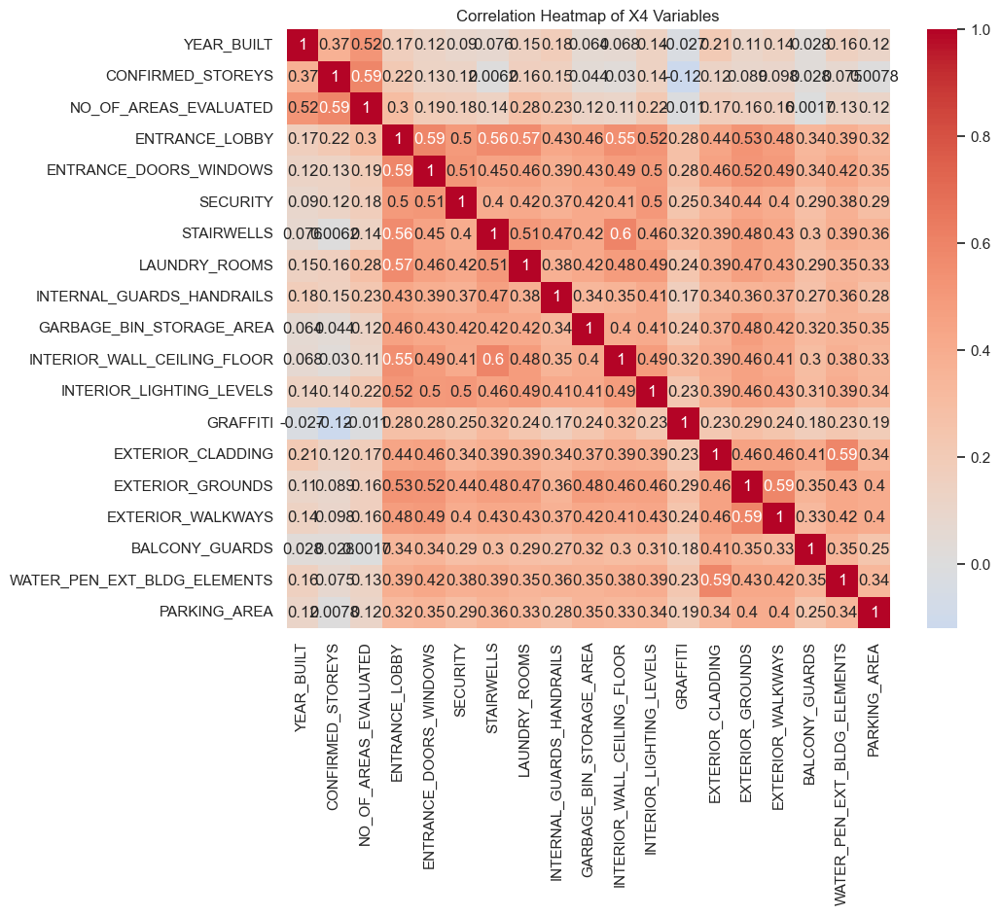

In [72]:
# Calculate the correlation matrix
correlation_matrix = X4.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)

plt.title('Correlation Heatmap of X4 Variables')
plt.show()

**In the heatmap we can observer that there are some correlations that over 0.5. However we can't drop everything so we're going to delete only one 'ENTRANCE_LOBBY' that's highly relevant to several columns and try to do it again.**

In [73]:
eva_columns3 = df_clean[[              
'YEAR_BUILT',                    
'CONFIRMED_STOREYS',             
'NO_OF_AREAS_EVALUATED',         
'ENTRANCE_DOORS_WINDOWS',        
'SECURITY',                      
'STAIRWELLS',                    
'LAUNDRY_ROOMS',                 
'INTERNAL_GUARDS_HANDRAILS',     
'GARBAGE_BIN_STORAGE_AREA',      
'INTERIOR_WALL_CEILING_FLOOR',   
'INTERIOR_LIGHTING_LEVELS',      
'GRAFFITI',                      
'EXTERIOR_CLADDING',             
'EXTERIOR_GROUNDS',              
'EXTERIOR_WALKWAYS',             
'BALCONY_GUARDS',               
'WATER_PEN_EXT_BLDG_ELEMENTS',   
'PARKING_AREA']]

In [74]:
X5 = eva_columns3
y5 = df_clean['SCORE']

In [75]:
X5_withconstant = sm.add_constant(X5)

# 1. Instantiate Model
myregression = sm.OLS(y5, X5_withconstant)

# 2. Fit Model (this returns a seperate object with the parameters)
myregression_results = myregression.fit()

# Looking at the summary
myregression_results.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  SCORE   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 3.896e+04
Date:                Wed, 06 Sep 2023   Prob (F-statistic):               0.00
Time:                        14:04:36   Log-Likelihood:                -18741.
No. Observations:               11152   AIC:                         3.752e+04
Df Residuals:                   11133   BIC:                         3.766e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -4.2248      1.499     -2.818      0.005      -7.164      -1.286
YEAR_BUILT                      0.0021      0.001      2.659      0.008       0.001       0.004
CONFIRMED_STOREYS               0.0247      0.003      9.597      0.000       0.020       0.030
NO_OF_AREAS_EVALUATED          -0.0579      0.010     -5.567      0.000      -0.078      -0.038
ENTRANCE_DOORS_WINDOWS          1.5276      0.022     68.804      0.000       1.484       1.571
SECURITY                        1.3880      0.018     76.414      0.000       1.352       1.424
STAIRWELLS                      1.6038      0.022     71.808      0.000       1.560       1.648
LAUNDRY_ROOMS                   1.5422      0.021     73.750      0.000       1.501       1.583
INTERNAL_GUARDS_HANDRAILS       1.3464      0.018     73.963      0.000       1.311       1.382
GARBAGE_BIN_STORAGE_AREA        1.4362      0.020     72.767      0.000       1.397       1.475
INTERIOR_WALL_CEILING_FLOOR     1.4963      0.022     67.063      0.000       1.453       1.540
INTERIOR_LIGHTING_LEVELS        1.3809      0.019     72.935      0.000       1.344       1.418
GRAFFITI                        1.2443      0.018     69.386      0.000       1.209       1.279
EXTERIOR_CLADDING               1.3158      0.024     54.941      0.000       1.269       1.363
EXTERIOR_GROUNDS                1.4684      0.023     63.247      0.000       1.423       1.514
EXTERIOR_WALKWAYS               1.2764      0.023     56.497      0.000       1.232       1.321
BALCONY_GUARDS                  0.9960      0.021     48.461      0.000       0.956       1.036
WATER_PEN_EXT_BLDG_ELEMENTS     1.1711      0.022     52.740      0.000       1.128       1.215
PARKING_AREA                    1.0413      0.020     52.750      0.000       1.003       1.080
==============================================================================
Omnibus:                      238.926   Durbin-Watson:                   1.828
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              469.268
Skew:                           0.129   Prob(JB):                    1.26e-102
Kurtosis:                       3.972   Cond. No.                     2.39e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.39e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Classification Models

**To use the classification models, we should check the target feature. The target variable must be categorical data.**

**'RESULTS_OF_SCORE' column is our target column. Let's explore it first.**

we have 4 levels in this column. 

The greatest level is 'Evaluation needs to be conducted in 3 years' and the mean of it is 90.21. The 86 to 100 scores belong here. 89 points is the median. 

'Evaluation needs to be conducted in 2 years' accounnt for the largest number as 7077. The mean is 75.43 and median is 76. The variance of it is the largest at 29.37. 

'Building Audit' is the price we should pay the most attention to. Because our goal is to make predictions so that we can avoid this score. Points 20 to 50 are included here. The mean is 45.79 and the median is 47.0.

In [76]:
agg_func_math = {
    'SCORE':
    ['count', 'mean', 'median', 'min', 'max', 'std', 'var']
}
df_clean.groupby(['RESULTS_OF_SCORE']).agg(agg_func_math).round(2)

SCORE                         \
                                            count   mean median min  max   
RESULTS_OF_SCORE                                                           
Building Audit                                 98  45.79   47.0  20   50   
Evaluation needs to be conducted in 1 year   2476  60.43   61.0  51   65   
Evaluation needs to be conducted in 2 years  7077  75.43   76.0  66   85   
Evaluation needs to be conducted in 3 years  1501  90.21   89.0  86  100   

                                                          
                                              std    var  
RESULTS_OF_SCORE                                          
Building Audit                               4.36  19.02  
Evaluation needs to be conducted in 1 year   3.67  13.50  
Evaluation needs to be conducted in 2 years  5.42  29.37  
Evaluation needs to be conducted in 3 years  3.51  12.30

**In the machine learning every variable should be presented as numbers. So we will make a new column.**

In [77]:
# create new column for categorical resuslt to change the value to numbers.
df_clean['RESULTS_CODE'] = df_clean['RESULTS_OF_SCORE']

# input the values depends on the 'RESULTS_OF_SCORE'
df_clean.loc[df_clean['RESULTS_OF_SCORE'] == 'Building Audit', 'RESULTS_CODE'] = 0
df_clean.loc[df_clean['RESULTS_OF_SCORE'] == 'Evaluation needs to be conducted in 1 year', 'RESULTS_CODE'] = 1
df_clean.loc[df_clean['RESULTS_OF_SCORE'] == 'Evaluation needs to be conducted in 2 years', 'RESULTS_CODE'] = 2
df_clean.loc[df_clean['RESULTS_OF_SCORE'] == 'Evaluation needs to be conducted in 3 years', 'RESULTS_CODE'] = 3


In [78]:
df_clean['RESULTS_CODE'] = df_clean['RESULTS_CODE'].astype(int)

In [79]:
df_clean['RESULTS_CODE'].value_counts()

RESULTS_CODE
2    7077
1    2476
3    1501
0      98
Name: count, dtype: int64

logistic regression

## RandomForest Model for score

In [80]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [81]:
X6 = df_clean.drop(['SCORE', 'RESULTS_OF_SCORE', 'RESULTS_CODE'], axis=1) 

In [82]:
X6_encoded = pd.get_dummies(X6, columns=['PROPERTY_TYPE', 'WARDNAME', 'GRID'])

In [83]:
y6 = df_clean['RESULTS_CODE']

In [84]:
X6_train, X6_test, y6_train, y6_test = train_test_split(X6_encoded, y6, test_size=0.2, random_state=42)

In [85]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X6_train, y6_train)

RandomForestRegressor(random_state=42)

In [86]:
y6_pred = rf_model.predict(X6_test)

In [87]:
mse6 = mean_squared_error(y6_test, y6_pred)
rmse6 = np.sqrt(mse6)
r2_6 = r2_score(y6_test, y6_pred)

print("Mean Squared Error:", mse6)
print("Mean Abolute Error:", rmse6)
print("R square:", r2_6)

Mean Squared Error: 0.05846239354549529
Mean Abolute Error: 0.2417899781742314
R square: 0.8414549901709085


**The Mean Squared Error (MSE) value obtained from the model evaluation is 5.85. In the context of this problem where SCORE values range from 0 to 100, an MSE of 5.85 can be considered relatively low, indicating that our model's predictions are reasonably close to the actual values.**

**Additonally, the R square is 0.84 and it is reasonable number in machine learning.**

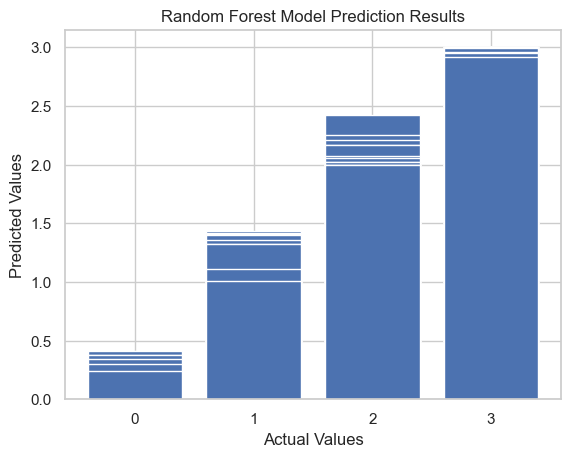

In [88]:
y6_pred = rf_model.predict(X6_train)
plt.bar(y6_train, y6_pred)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Random Forest Model Prediction Results")
plt.xticks(range(0, 4))
plt.show()

In [89]:
y6_train.value_counts()

RESULTS_CODE
2    5642
1    1987
3    1211
0      81
Name: count, dtype: int64

In [90]:
y6_pred

array([2.  , 2.01, 2.23, ..., 2.92, 2.  , 1.01])

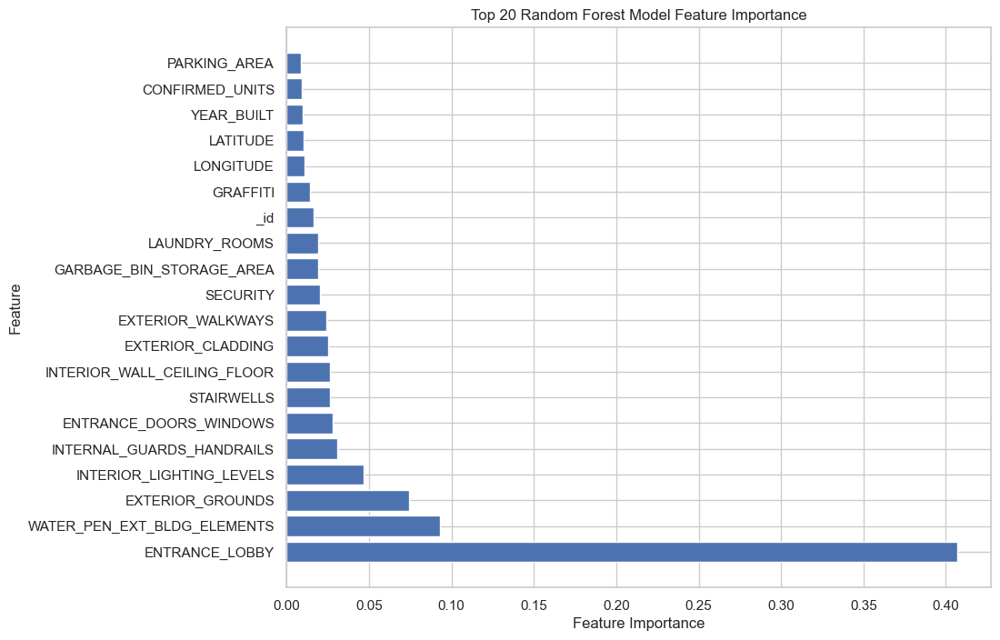

In [91]:
feature_importances = rf_model.feature_importances_
feature_names = X6_train.columns

# Gtop 20 features
top_20_indices = feature_importances.argsort()[-20:][::-1]

# feature names and importances
top_20_features = [feature_names[i] for i in top_20_indices]
top_20_importances = [feature_importances[i] for i in top_20_indices]

plt.figure(figsize=(10, 8))
plt.barh(top_20_features, top_20_importances)
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Top 20 Random Forest Model Feature Importance")
plt.show()

## K Nearest Neighbors

In [92]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [93]:
X11 = df_clean.drop(['SCORE', 'RESULTS_OF_SCORE', 'RESULTS_CODE'], axis=1)
y11 = df_clean['RESULTS_OF_SCORE']

# we have object columns like 'PROPERTY_TYPE', 'WARDNAME' , etc.
X11_encoded = pd.get_dummies(X11, columns=['PROPERTY_TYPE', 'WARDNAME', 'GRID'])

# Split the data
X_train11, X_test11, y_train11, y_test11 = train_test_split(X11_encoded, y11, test_size=0.3, random_state=1)

In [94]:
# Instantiate the model & fit it to our data
KNN_model = KNeighborsClassifier(n_neighbors=3)
KNN_model.fit(X_train11, y_train11)

KNeighborsClassifier(n_neighbors=3)

In [95]:
# Score the model on the test set
train_predictions = KNN_model.predict(X_train11)
test_predictions = KNN_model.predict(X_test11)

train_accuracy = accuracy_score(train_predictions, y_train11)
test_accuracy = accuracy_score(test_predictions, y_test11)

print(f"Train set accuracy: {train_accuracy}")
print(f"Test set accuracy: {test_accuracy}")

Train set accuracy: 0.7950294645144761
Test set accuracy: 0.6413628212791392


**When we put three(3) for n_neighbors parameter, It looks over-fitting because the train set accuracy is higher than the test set accuracy.**

**So, let's plot the relation between the accuracy and the number of neignbors to try the other numbers.**

In [96]:
n_neighbor = range(1, 60, 10)

train_accuracy = []
test_accuracy = []

for n in n_neighbor:
    
    # Instantiate the model & fit it to our data
    KNN_model = KNeighborsClassifier(n_neighbors=n)
    KNN_model.fit(X_train11, y_train11)
    
    # Score the model and apppend in to the lists
    train_accuracy.append(KNN_model.score(X_train11, y_train11))
    test_accuracy.append(KNN_model.score(X_test11, y_test11))

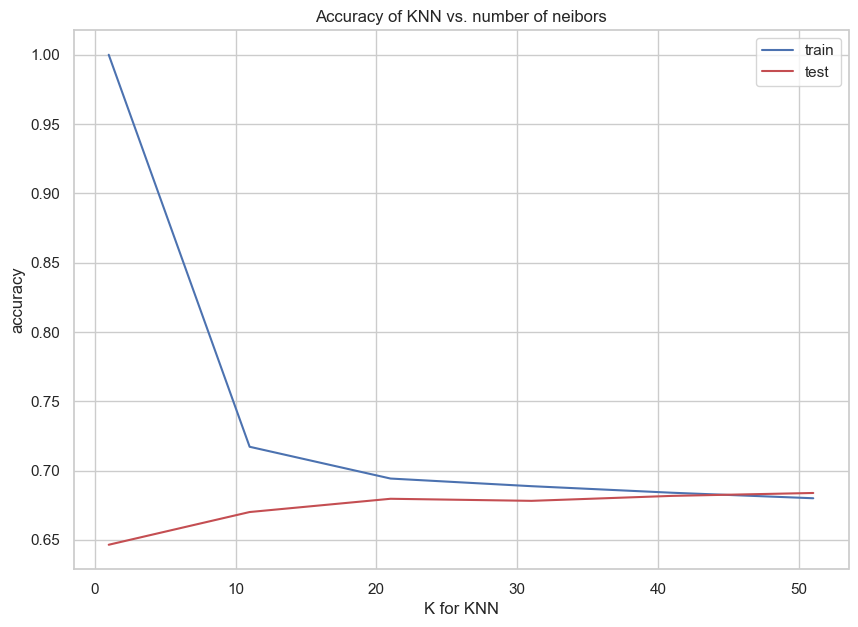

In [97]:
plt.figure(figsize=(10,7))

plt.plot(n_neighbor, train_accuracy, color='b', label = 'train')
plt.plot(n_neighbor, test_accuracy, color='r', label = 'test')

plt.xlabel('K for KNN')
plt.ylabel('accuracy')
plt.legend()

plt.title('Accuracy of KNN vs. number of neibors')

plt.show()


**The number 43 seems appropriate. Let's try 43.**

In [98]:
# Instantiate the model & fit it to our data with parameter 43
KNN_model = KNeighborsClassifier(n_neighbors=43)
KNN_model.fit(X_train11, y_train11)

# Score the model on the test set
train_predictions = KNN_model.predict(X_train11)
test_predictions = KNN_model.predict(X_test11)

train_accuracy = accuracy_score(train_predictions, y_train11)
test_accuracy = accuracy_score(test_predictions, y_test11)

print(f"Train set accuracy: {train_accuracy}")
print(f"Test set accuracy: {test_accuracy}")

Train set accuracy: 0.683192416090187
Test set accuracy: 0.682904961147639


**As we review the number 43 is best for our model. According the result, our model predict with a probability of 68%.**

## DecisionTree for Classfication

In [99]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

In [100]:
from sklearn.tree import plot_tree

In [101]:
X21 = df_clean.drop(['SCORE', 'RESULTS_OF_SCORE', 'RESULTS_CODE'], axis=1)  # Features
y21 = df_clean['RESULTS_CODE']  # Target variable

In [102]:
X21_encoded = pd.get_dummies(X21, columns=['PROPERTY_TYPE', 'WARDNAME', 'GRID'])

X_train21, X_test21, y_train21, y_test21 = train_test_split(X21_encoded, y21, test_size=0.2, random_state=42)

In [103]:
df_clean['RESULTS_OF_SCORE'].value_counts()

RESULTS_OF_SCORE
Evaluation needs to be conducted in 2 years    7077
Evaluation needs to be conducted in 1 year     2476
Evaluation needs to be conducted in 3 years    1501
Building Audit                                   98
Name: count, dtype: int64

In [104]:
df_clean['RESULTS_CODE'].value_counts()

RESULTS_CODE
2    7077
1    2476
3    1501
0      98
Name: count, dtype: int64

In [105]:
df_clean['RESULTS_CODE'].count()

11152

In [106]:
dt_model = DecisionTreeClassifier(random_state=42, max_depth=3, min_samples_leaf=5)
dt_model.fit(X_train21, y_train21)

DecisionTreeClassifier(max_depth=3, min_samples_leaf=5, random_state=42)

< RESULTS_OF_SCORE >

0 : Building Audit<br>
1 : Evaluation needs to be conducted in 1 year     
2 : Evaluation needs to be conducted in 2 years  
3 : Evaluation needs to be conducted in 3 years   

In [107]:
y_pred21 = dt_model.predict(X_test21)

accuracy = accuracy_score(y_test21, y_pred21)
report = classification_report(y_test21, y_pred21)

print(f"Accuracy: {accuracy}")
print("Report:\n", report)

Accuracy: 0.8014343343792022
Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        17
           1       0.77      0.73      0.75       489
           2       0.81      0.92      0.86      1435
           3       0.80      0.39      0.53       290

    accuracy                           0.80      2231
   macro avg       0.59      0.51      0.53      2231
weighted avg       0.79      0.80      0.79      2231



**The values of the most important 'Building Audit' for us all came out too small at 0.00. The reason is that the ratio of values is too small at 0.88%. That is why we have to upsampling.**

In [108]:
len(df_clean[df_clean['RESULTS_OF_SCORE'] == 'Building Audit'])/df_clean['RESULTS_OF_SCORE'].count()

0.008787661406025825

### Upsampling

In [109]:
from sklearn.utils import resample

In [110]:
X22 = df_clean.drop(['SCORE', 'RESULTS_OF_SCORE', 'RESULTS_CODE'], axis=1)  # Features
y22 = df_clean['RESULTS_CODE']  # Target variable

X22_encoded = pd.get_dummies(X22, columns=['PROPERTY_TYPE', 'WARDNAME', 'GRID'])

X_train22, X_test22, y_train22, y_test22 = train_test_split(X22_encoded, y22, test_size=0.2, random_state=42)

In [111]:
from imblearn.over_sampling import SMOTE

# SMOTE
smote = SMOTE(random_state=42)

print('The numbers of Building Audit(0) before:', X_train22[y_train22 == 0].shape[0])
print('The numbers of Building Audit(1) before:', X_train22[y_train22 == 1].shape[0])
print('The numbers of Building Audit(2) before:', X_train22[y_train22 == 2].shape[0])
print('The numbers of Building Audit(3) before:', X_train22[y_train22 == 3].shape[0])

# resampling
X_train_resampled22, y_train_resampled22 = smote.fit_resample(X_train22, y_train22)


print()
print('The numbers of Building Audit(0) after:', X_train_resampled22[y_train_resampled22 == 0].shape[0])
print('The numbers of Building Audit(1) after:', X_train_resampled22[y_train_resampled22 == 1].shape[0])
print('The numbers of Building Audit(2) after:', X_train_resampled22[y_train_resampled22 == 2].shape[0])
print('The numbers of Building Audit(3) after:', X_train_resampled22[y_train_resampled22 == 3].shape[0])

The numbers of Building Audit(0) before: 81
The numbers of Building Audit(1) before: 1987
The numbers of Building Audit(2) before: 5642
The numbers of Building Audit(3) before: 1211

The numbers of Building Audit(0) after: 5642
The numbers of Building Audit(1) after: 5642
The numbers of Building Audit(2) after: 5642
The numbers of Building Audit(3) after: 5642


In [112]:
dt_model = DecisionTreeClassifier(random_state=42, max_depth=3, min_samples_leaf=5)
dt_model.fit(X_train_resampled22, y_train_resampled22)

DecisionTreeClassifier(max_depth=3, min_samples_leaf=5, random_state=42)

In [113]:
y_pred22 = dt_model.predict(X_test22)

accuracy = accuracy_score(y_test22, y_pred22)
report = classification_report(y_test22, y_pred22)

print(f"Accuracy: {accuracy}")
print("Report:\n", report)

Accuracy: 0.7709547288211565
Report:
               precision    recall  f1-score   support

           0       0.34      0.71      0.46        17
           1       0.68      0.76      0.72       489
           2       0.86      0.79      0.82      1435
           3       0.60      0.71      0.65       290

    accuracy                           0.77      2231
   macro avg       0.62      0.74      0.66      2231
weighted avg       0.79      0.77      0.78      2231



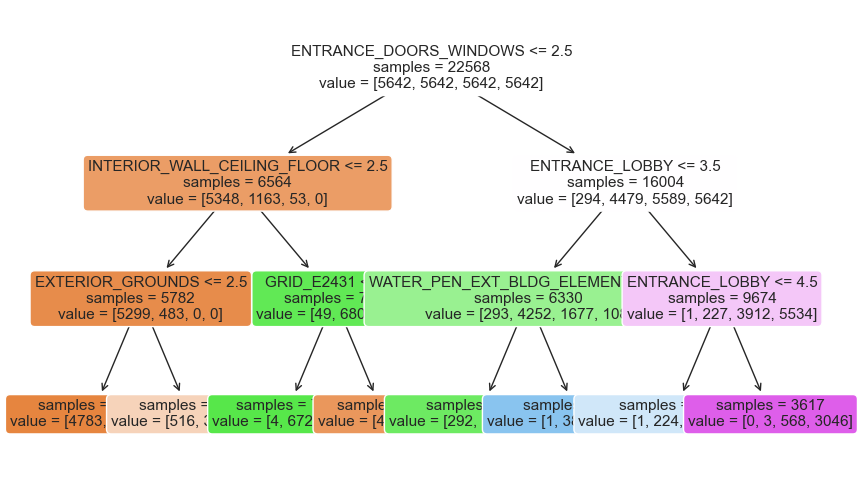

In [114]:
plt.figure(figsize=(10, 6))
plot_tree(dt_model, 
          feature_names=dt_model.feature_names_in_, 
          rounded=True,
          impurity=False,
          filled=True,
          fontsize=11);

**In the above cell, we set max_depth as 5. However the accuracy will be changed when we set it differently so we should find what is best number to make 'Decision Tree'.**

In [115]:
train_acc = []
test_acc = []

# loop for finding best max_depth
for max_depth in range(1,12):
    
    # initialize model
    dt_model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    
    # fit model
    dt_model.fit(X_train_resampled22, y_train_resampled22)
    
    # score model
    print('* The number of max_depth :', max_depth)
    print('* The number of actual depth:', dt_model.get_depth())
    print('Test accuracy:', dt_model.score(X_test22, y_test22))
    print('Train accuracy', dt_model.score(X_train_resampled22, y_train_resampled22))
    print('')
    
    test_acc.append(dt_model.score(X_test22, y_test22))
    train_acc.append(dt_model.score(X_train_resampled22, y_train_resampled22))

* The number of max_depth : 1
* The number of actual depth: 1
Test accuracy: 0.13536530703720304
Train accuracy 0.4869727047146402

* The number of max_depth : 2
* The number of actual depth: 2
Test accuracy: 0.3290004482294935
Train accuracy 0.6985554767812833

* The number of max_depth : 3
* The number of actual depth: 3
Test accuracy: 0.7709547288211565
Train accuracy 0.7706043956043956

* The number of max_depth : 4
* The number of actual depth: 4
Test accuracy: 0.7543702375616316
Train accuracy 0.8222704714640199

* The number of max_depth : 5
* The number of actual depth: 5
Test accuracy: 0.770058269834155
Train accuracy 0.8528890464374336

* The number of max_depth : 6
* The number of actual depth: 6
Test accuracy: 0.8095024652622143
Train accuracy 0.8663151364764268

* The number of max_depth : 7
* The number of actual depth: 7
Test accuracy: 0.8242940385477364
Train accuracy 0.8794753633463311

* The number of max_depth : 8
* The number of actual depth: 8
Test accuracy: 0.8072

**We will draw a plot to make it easy to recognize at a glance.**

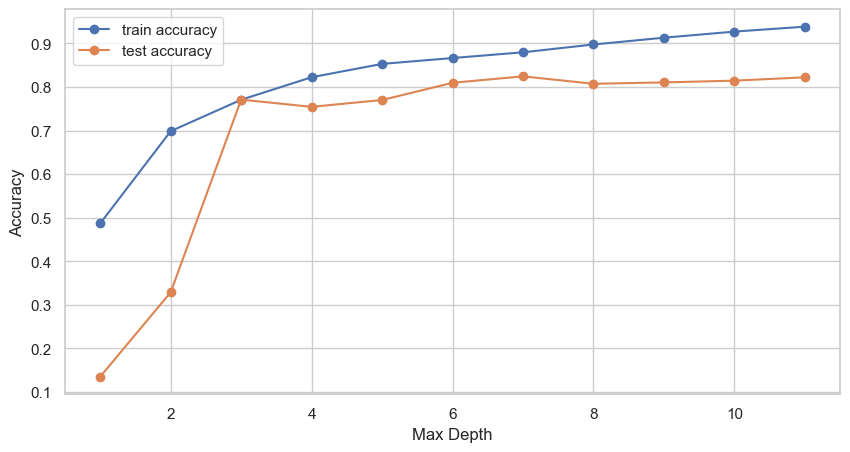

In [116]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, 12), train_acc, marker="o", label="train accuracy")
plt.plot(range(1, 12), test_acc,  marker="o", label="test accuracy")
plt.xlabel("Max Depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

**let's try max_depth as three(3).**

In [117]:
dt_model = DecisionTreeClassifier(random_state=42, max_depth=7, min_samples_leaf=5)
dt_model.fit(X_train_resampled22, y_train_resampled22)

y_pred23 = dt_model.predict(X_test22)

accuracy23 = accuracy_score(y_test22, y_pred23)
report23 = classification_report(y_test22, y_pred23)

print(f"Accuracy: {accuracy23}")
print("Report:\n", report23)

Accuracy: 0.8256387270282385
Report:
               precision    recall  f1-score   support

           0       0.92      0.71      0.80        17
           1       0.84      0.82      0.83       489
           2       0.91      0.81      0.86      1435
           3       0.57      0.91      0.70       290

    accuracy                           0.83      2231
   macro avg       0.81      0.81      0.80      2231
weighted avg       0.85      0.83      0.83      2231



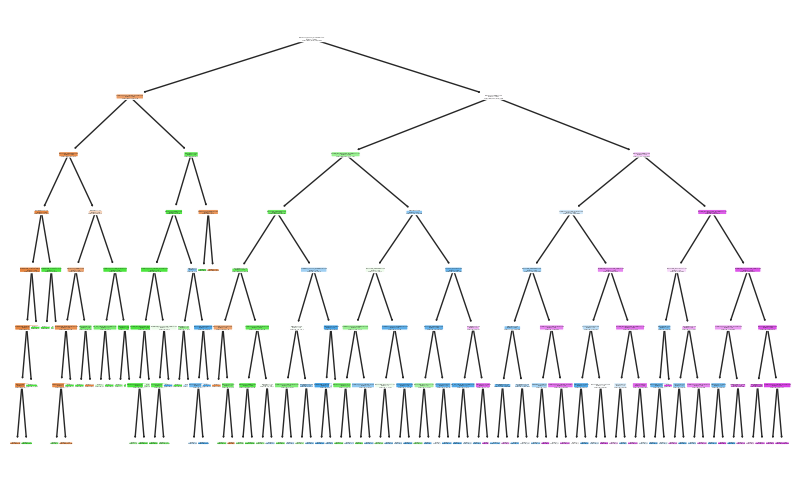

In [118]:
plt.figure(figsize=(10, 6))
plot_tree(dt_model, 
          feature_names=dt_model.feature_names_in_, 
          rounded=True,
          impurity=False,
          filled=True);

## Logistic Regression

In [119]:
X = df_clean.drop(['SCORE', 'RESULTS_OF_SCORE', 'RESULTS_CODE'], axis=1)  # Features
y = df_clean['RESULTS_CODE']  # Target variable

import statsmodels.api as sm

y_binary = np.where(y.isin([1 ,2, 3]), 1, 0)

# We still need to manually add an intercept
X_withconstant = sm.add_constant(X)
X_withconstant

X_encoded = pd.get_dummies(X_withconstant, columns=['PROPERTY_TYPE', 'WARDNAME', 'GRID'])

from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy=0.5)

X_resampled, y_resampled = smote.fit_resample(X_encoded, y_binary)

# 1. Instantiate model
mylogreg = sm.Logit(y_resampled.astype(float), X_resampled.astype(float))

#2. Fit the model (this returns a separate object with the parameters)
mylogreg_results = mylogreg.fit()

         Current function value: inf
         Iterations: 35


LinAlgError: Singular matrix

In [ ]:
model_logreg.params

y.info()

In [ ]:
y.info()

1. Cleaning: missing values, duplicated data, data types. If you decide drop any column here because has a lot nulls, then explain why is had to compute the missing data and drop it.
2. EDA: Explore your target, plot your target, exploring numerical and categorical columns, plot the distributions numerical - histograms and categorical bar graphs. 
- Explore possible relations among your columns, you can check relation between your predictor to avoid multicolinearity, also you can check the correlation between your target and your predictors. In this part you can apply some test like pearson or chi2 depending on the case. 
4. Preprocessing: try to convert your categorical columns into numerical columns. At the end of this step you should have one dataframe with all of your predictor in numerical format. Use one hot encoding, labeling, binarize the columns, according each case. Doing this step maybe you can decide drop some columns by your criteria. finishing this step your dataframe is ready for modeling.
3. modeling: start with LINEAR REG MODEL using all of your predictors. subsequently you can try other models, or different sets of data... 